<!-- DON'T EDIT THIS CELL! -->
<!-- TYPE SHIFT+ENTER AND GO TO THE NEXT CELL -->

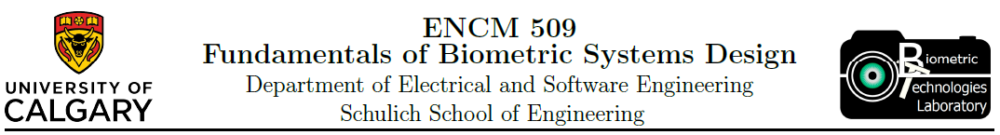

# ENCM 509 - Lab 4 Report

**Student Names**


**Mushtaba Al Yasseen (30094000)**
\
**Usman Khan (30092202)**

Importing all necessary libraries

In [34]:
import cv2 as cv
import numpy as np

# NOTE: We are using Scikit-Image version 0.18.3
# If you have a version different from that, please open your Anaconda prompt and type:
# conda install -c anaconda scikit-image=0.18.3

from skimage.io import imread
from skimage.util import img_as_ubyte
from skimage.exposure import equalize_hist, equalize_adapthist
from skimage.filters import median
from skimage.measure import find_contours

from scipy.signal.signaltools import wiener

from utils_encm.poincare import calculate_singularities
from utils_encm.segmentation import segmentation
from utils_encm.normalization import normalize
from utils_encm.gabor_filter import gabor_filter
from utils_encm.frequency import ridge_freq
from utils_encm.orientation import calculate_angles, visualize_angles
from utils_encm.crossing_number import calculate_minutiae
from utils_encm.skeletonize import skeletonize
from utils_encm.MatchGaborFeat import MatchGaborFeat
from utils_encm.align2 import align2
from utils_encm.match import match

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib as mpl
# setting the default colormap for images only
mpl.rc('image', cmap='gray')

C:\Users\musht\AppData\Local\Temp\ipykernel_34548\1707584806.py:14: DeprecationWarning: Please use `wiener` from the `scipy.signal` namespace, the `scipy.signal.signaltools` namespace is deprecated.
  from scipy.signal.signaltools import wiener


# **Introduction:**

## **Exercise 1:**

First we will read images of fingerprints taken during the lab of different quality. We will be using data from two different left thumbs to draw our conclusions.

In [35]:
left_thumb1_good = img_as_ubyte(imread('./fingerPrints/MushtabaLeft/5.bmp', as_gray=True))
left_thumb1_bad = img_as_ubyte(imread('./fingerPrints/MushtabaLeft/7.bmp', as_gray=True))
left_thumb2_good = img_as_ubyte(imread('./fingerPrints/UsmanLeft/6.bmp', as_gray=True))
left_thumb2_bad = img_as_ubyte(imread('./fingerPrints/UsmanLeft/3.bmp', as_gray=True))

We'll utilize the function below to perform all the pre-processing tasks outside of histogram equalization as well as calculate the number of minutiae and singularities.

In [36]:
def fingerprint_processing(img, block_size=16, threshold=0.4):
    output = {}
    
    # normalization - removes the effects of sensor noise and finger pressure differences.
    normalized_img = normalize(img.copy(), float(100), float(100))
    output['normalized_img'] = normalized_img
    
    # segmentation
    (segmented_img, normim, mask) = segmentation(normalized_img, 
                                                 block_size, 
                                                 threshold)
    output['segmented_img'] = segmented_img
    output['normim'] = normim
    output['mask'] = mask
    
    # orientation estimation
    angles = calculate_angles(normalized_img, 
                              W=block_size, smooth=True)
    orientation_img = visualize_angles(segmented_img, mask, angles, W=block_size)
    output['angles'] = angles
    
    # find the overall frequency of ridges
    freq = ridge_freq(normim, mask, angles, 
                      block_size, kernel_size=5, 
                      minWaveLength=5, maxWaveLength=15)
    output['freq'] = freq
    
    # create gabor filter and do the actual filtering
    gabor_img = gabor_filter(normim, angles, freq, block_size)
    output['gabor_img'] = gabor_img
    
    # create the skeleton
    thin_image = skeletonize(gabor_img)
    output['thin_image'] = thin_image
    
    # find the minutiae
    minutiae_lst, minutiae_img, minutiae_arr = calculate_minutiae(thin_image, mask)
    output['minutiae_lst'] = minutiae_lst
    output['minutiae_img'] = minutiae_img
    output['minutiae_array'] = minutiae_arr
    
    # singularities
    singularities_lst, singularities_img = calculate_singularities(thin_image, 
                                                                   angles, block_size, 
                                                                   mask)

    plt.figure(figsize=(14,8))
    plt.subplot(2,4,1); plt.imshow(img, cmap='gray');
    plt.title('Original Image')
    plt.subplot(2,4,2); plt.imshow(normalized_img, cmap='gray')
    plt.title('Image Normalized')
    plt.subplot(2,4,3); plt.imshow(segmented_img, cmap='gray');
    plt.title('Segmented Image')
    plt.subplot(2,4,4); plt.imshow(orientation_img);
    plt.title('Ridges Orientation')
    plt.subplot(2,4,5); plt.imshow(gabor_img, cmap='gray');
    plt.title('Result Of Gabor Filtering')
    plt.subplot(2,4,6); plt.imshow(thin_image, cmap='gray');
    plt.title('Fingerprint Skeleton')
    plt.subplot(2,4,7); plt.imshow(minutiae_img);
    plt.title('Minutiae\nEndings: red - Bifurcations: green');
    plt.subplot(2,4,8); plt.imshow(singularities_img);
    plt.title('Singularities');

    print('Total of minutiae detected: %d' % (len(minutiae_lst)))
    print('Total of singularities detected: %d' % (len(singularities_lst)))
    
    output['singularities_lst'] = singularities_lst
    output['singularities_img'] = singularities_img

Next, we will perform all the types of pre-processing, and then identify if histogram equalization affects the number of minutiae and singularities.

#### Left Thumb #1 (Good) With Histogram Equalization:

Total of minutiae detected: 104
Total of singularities detected: 8


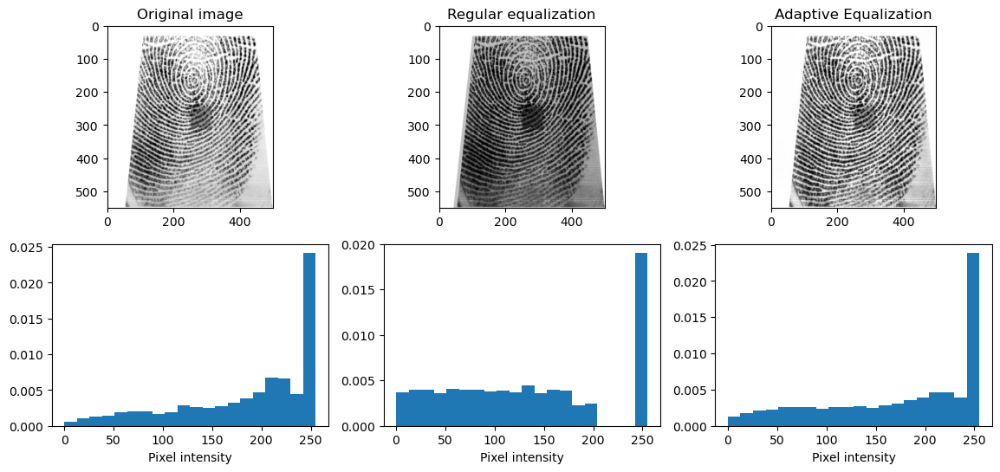

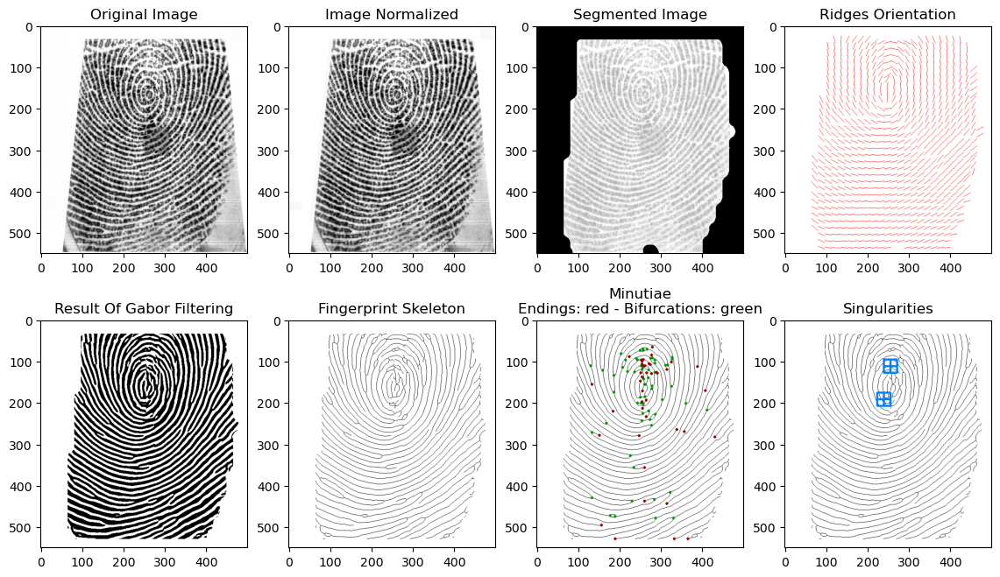

In [37]:
left_thumb1_good_eq1 = img_as_ubyte(equalize_hist(left_thumb1_good))
left_thumb1_good_eq2 = img_as_ubyte(equalize_adapthist(left_thumb1_good))

plt.figure(figsize=(14,6))
plt.subplot(2,3,1)
plt.imshow(left_thumb1_good); plt.title('Original image')
plt.subplot(2,3,2)
plt.imshow(left_thumb1_good_eq1); plt.title('Regular equalization')
plt.subplot(2,3,3)
plt.imshow(left_thumb1_good_eq2); plt.title('Adaptive Equalization');
plt.subplot(2,3,4)
plt.hist(left_thumb1_good.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,5)
plt.hist(left_thumb1_good_eq1.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,6)
plt.hist(left_thumb1_good_eq2.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity');

fingerprint_processing(left_thumb1_good_eq2)

#### Left Thumb #1 (Good) Without Histogram Equalization:

Total of minutiae detected: 65
Total of singularities detected: 4


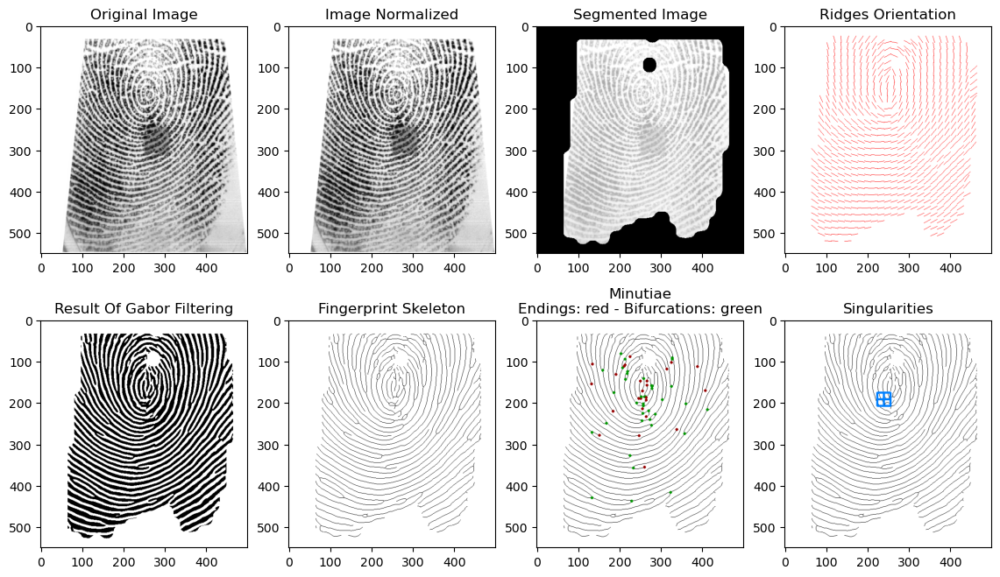

In [38]:
fingerprint_processing(left_thumb1_good)

#### Left Thumb #1 (Bad) With Histogram Equalization:

Total of minutiae detected: 111
Total of singularities detected: 10


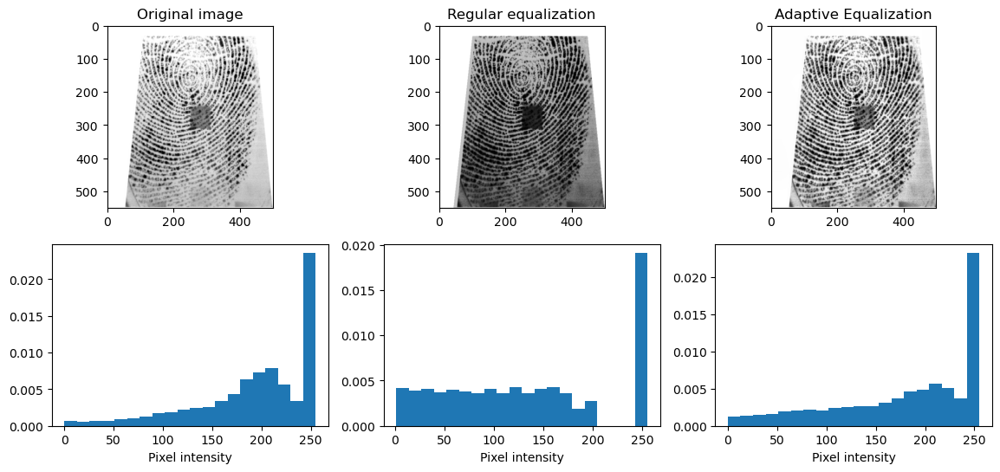

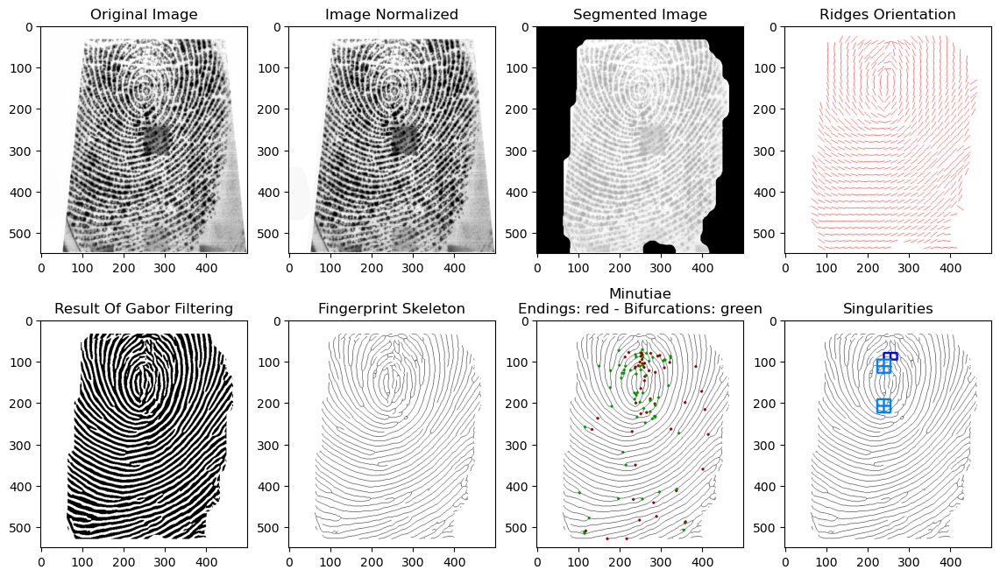

In [39]:
left_thumb1_bad_eq1 = img_as_ubyte(equalize_hist(left_thumb1_bad))
left_thumb1_bad_eq2 = img_as_ubyte(equalize_adapthist(left_thumb1_bad))

plt.figure(figsize=(14,6))
plt.subplot(2,3,1)
plt.imshow(left_thumb1_bad); plt.title('Original image')
plt.subplot(2,3,2)
plt.imshow(left_thumb1_bad_eq1); plt.title('Regular equalization')
plt.subplot(2,3,3)
plt.imshow(left_thumb1_bad_eq2); plt.title('Adaptive Equalization');
plt.subplot(2,3,4)
plt.hist(left_thumb1_bad.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,5)
plt.hist(left_thumb1_bad_eq1.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,6)
plt.hist(left_thumb1_bad_eq2.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity');

fingerprint_processing(left_thumb1_bad_eq2)

#### Left Thumb #1 (Bad) Without Histogram Equalization:

Total of minutiae detected: 50
Total of singularities detected: 4


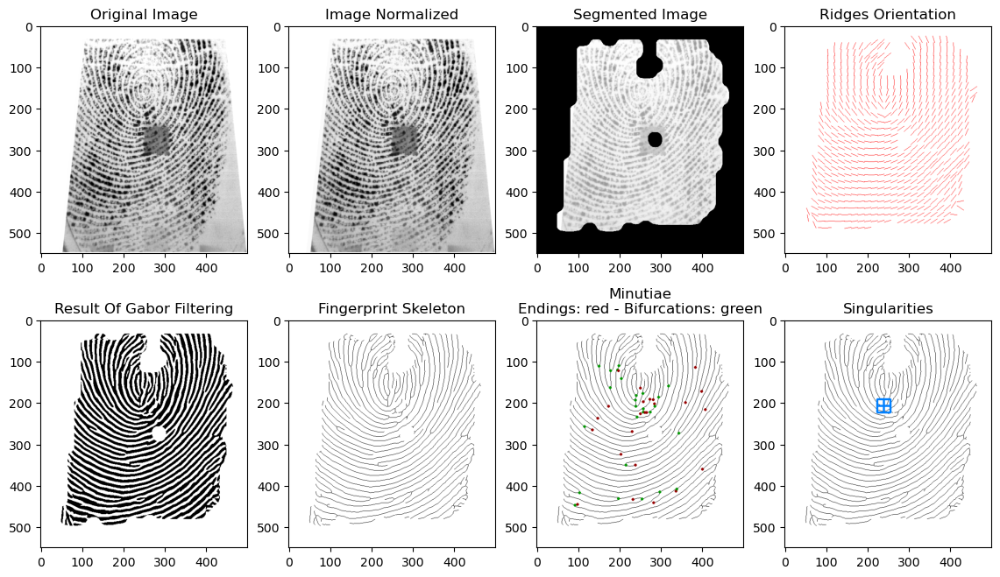

In [40]:
fingerprint_processing(left_thumb1_bad)

#### Left Thumb #2 (Good) With Histogram Equalization:

Total of minutiae detected: 105
Total of singularities detected: 4


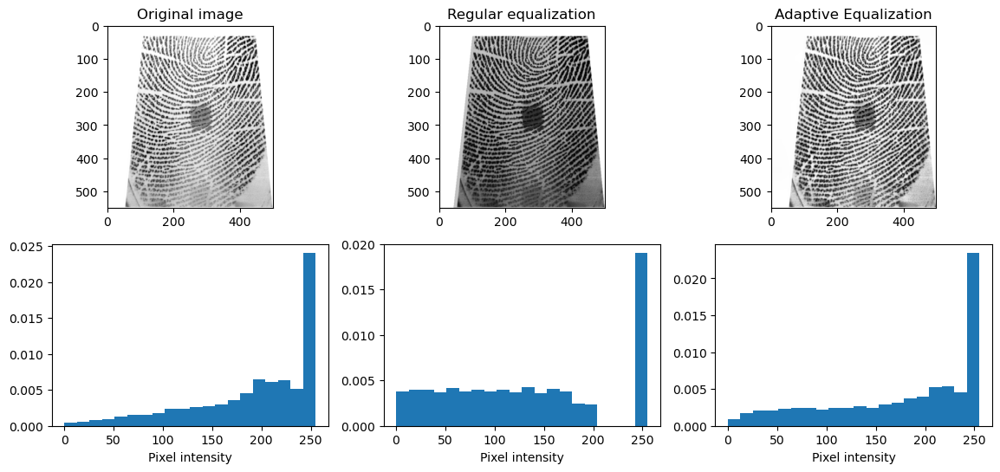

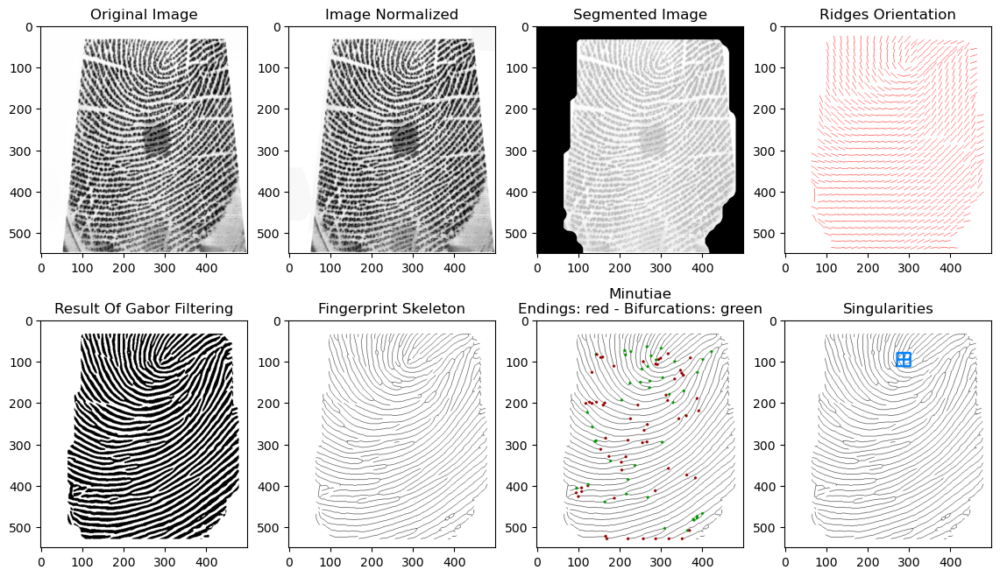

In [41]:
left_thumb2_good_eq1 = img_as_ubyte(equalize_hist(left_thumb2_good))
left_thumb2_good_eq2 = img_as_ubyte(equalize_adapthist(left_thumb2_good))

plt.figure(figsize=(14,6))
plt.subplot(2,3,1)
plt.imshow(left_thumb2_good); plt.title('Original image')
plt.subplot(2,3,2)
plt.imshow(left_thumb2_good_eq1); plt.title('Regular equalization')
plt.subplot(2,3,3)
plt.imshow(left_thumb2_good_eq2); plt.title('Adaptive Equalization');
plt.subplot(2,3,4)
plt.hist(left_thumb2_good.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,5)
plt.hist(left_thumb2_good_eq1.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,6)
plt.hist(left_thumb2_good_eq2.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity');

fingerprint_processing(left_thumb2_good_eq2)

#### Left Thumb #2 (Good) Without Histogram Equalization:

Total of minutiae detected: 120
Total of singularities detected: 4


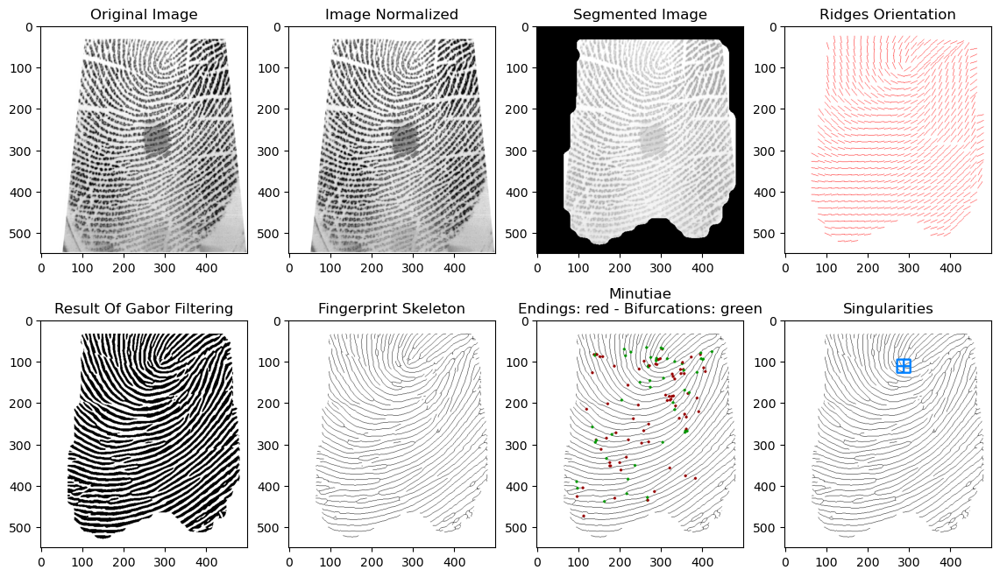

In [42]:
fingerprint_processing(left_thumb2_good)

#### Left Thumb #2 (Bad) With Histogram Equalization:

Total of minutiae detected: 78
Total of singularities detected: 0


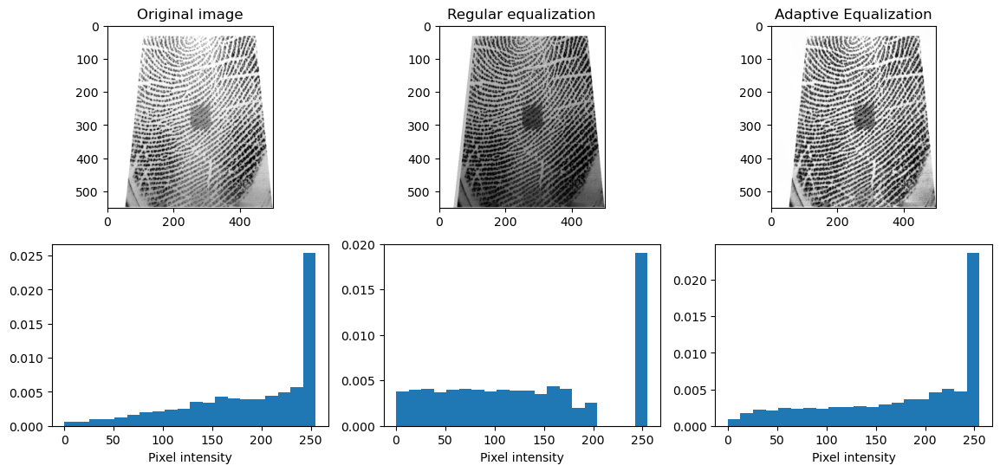

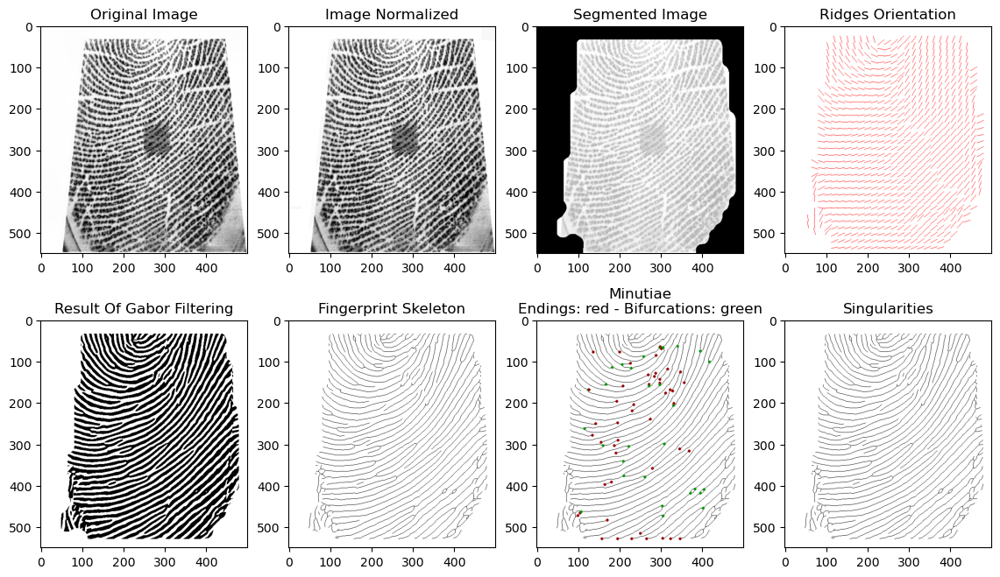

In [43]:
left_thumb2_bad_eq1 = img_as_ubyte(equalize_hist(left_thumb2_bad))
left_thumb2_bad_eq2 = img_as_ubyte(equalize_adapthist(left_thumb2_bad))

plt.figure(figsize=(14,6))
plt.subplot(2,3,1)
plt.imshow(left_thumb2_bad); plt.title('Original image')
plt.subplot(2,3,2)
plt.imshow(left_thumb2_bad_eq1); plt.title('Regular equalization')
plt.subplot(2,3,3)
plt.imshow(left_thumb2_bad_eq2); plt.title('Adaptive Equalization');
plt.subplot(2,3,4)
plt.hist(left_thumb2_bad.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,5)
plt.hist(left_thumb2_bad_eq1.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity')
plt.subplot(2,3,6)
plt.hist(left_thumb2_bad_eq2.ravel(), bins=20, density=True)
plt.xlabel('Pixel intensity');

fingerprint_processing(left_thumb2_bad_eq2)

#### Left Thumb #2 (Bad) Without Histogram Equalization:

Total of minutiae detected: 75
Total of singularities detected: 0


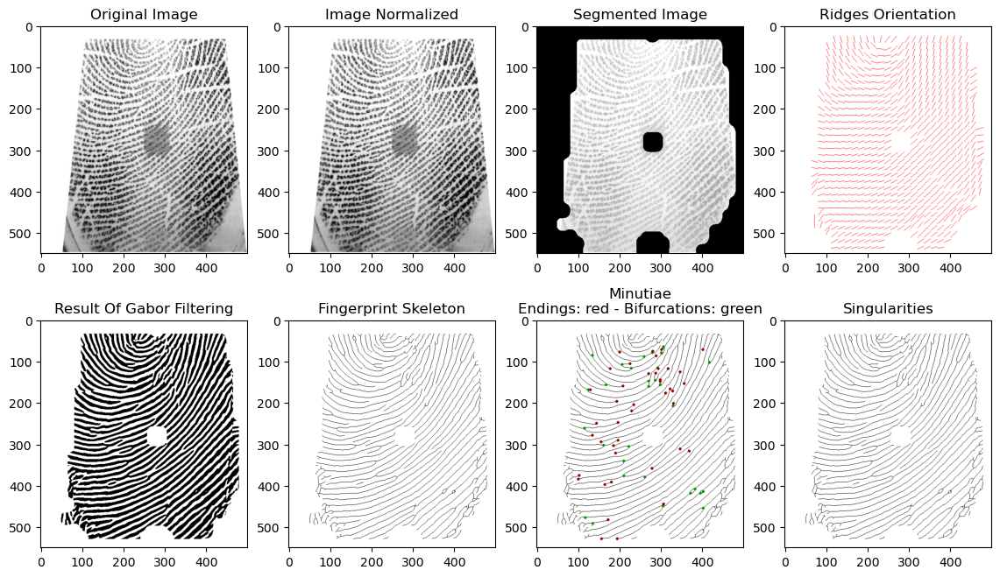

In [44]:
fingerprint_processing(left_thumb2_bad)

#### Analysis Of Data:

## **Exercise 2:**

Next, we will repeat the process, however, instead of histogram utilizing, we will be utilizing the Weiner de-noising filter and then identify whether or not it has an effect on the number of minutiae and singularities.

#### Left Thumb #1 (Good) With Weiner:

Total of minutiae detected: 49
Total of singularities detected: 2


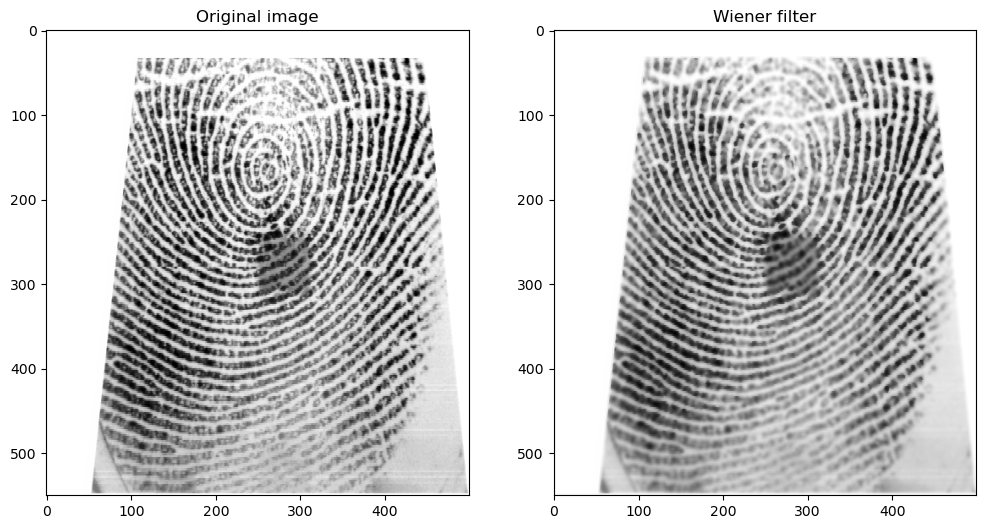

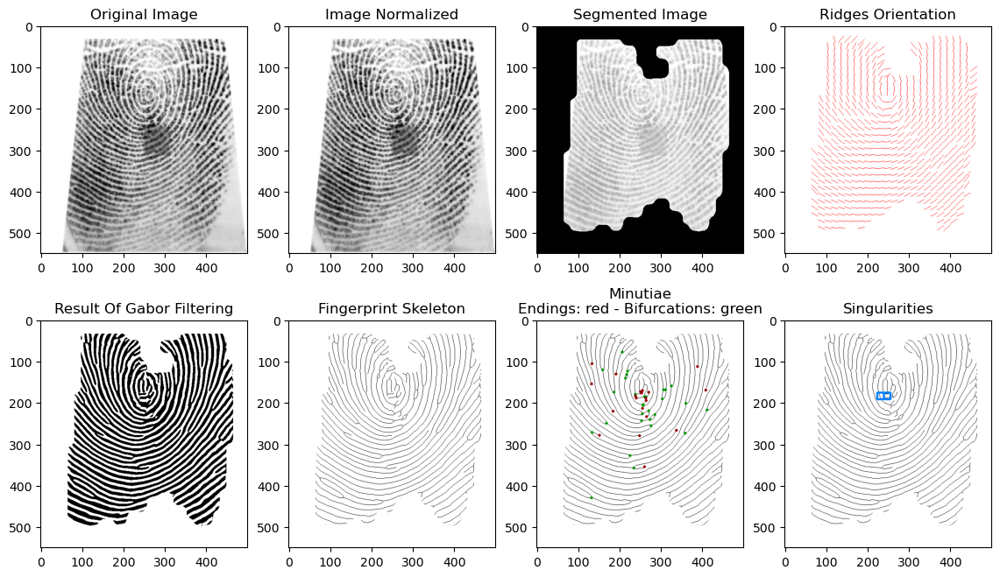

In [45]:
# Wiener filter needs the input image as float (not uint8)
# the (5,5) corresponds to the sized of the window to considered during the processing.
img_wiener = wiener(left_thumb1_good.astype('float64'), (5,5))
# is necessary to convert the output back to uint8. 
# some additional steps are necessary to have it in 0-255. 
img_wiener = img_as_ubyte((img_wiener-np.min(img_wiener))/(np.max(img_wiener)-np.min(img_wiener)))

plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.imshow(left_thumb1_good); plt.title('Original image')
plt.subplot(1,2,2)
plt.imshow(img_wiener); plt.title('Wiener filter')

fingerprint_processing(img_wiener)

#### Left Thumb #1 (Good) Without Weiner:

Total of minutiae detected: 65
Total of singularities detected: 4


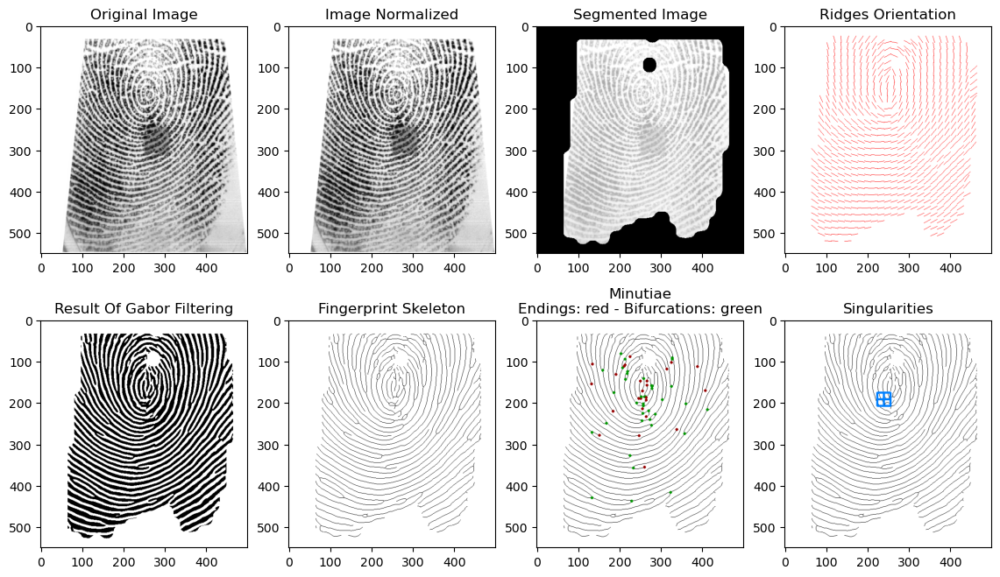

In [46]:
fingerprint_processing(left_thumb1_good)

#### Left Thumb #1 (Bad) With Weiner:

Total of minutiae detected: 19
Total of singularities detected: 0


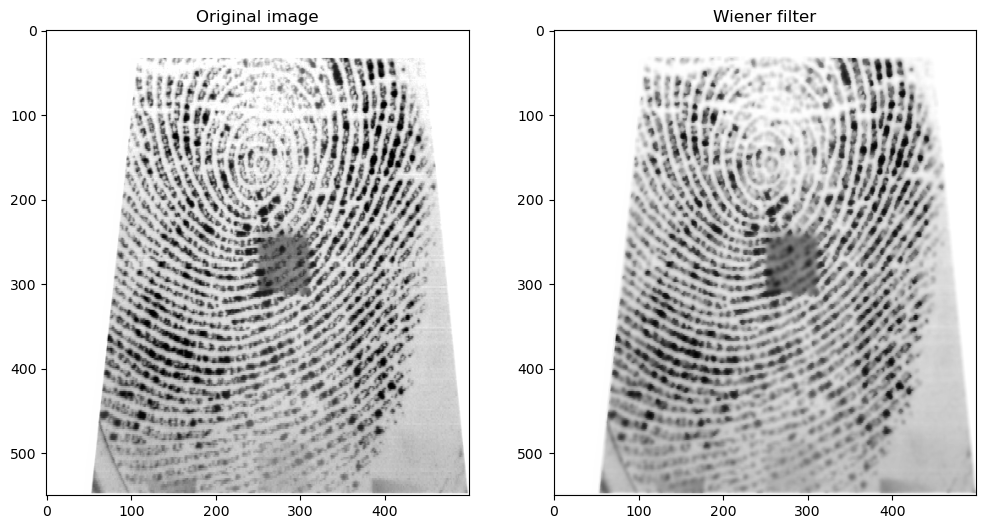

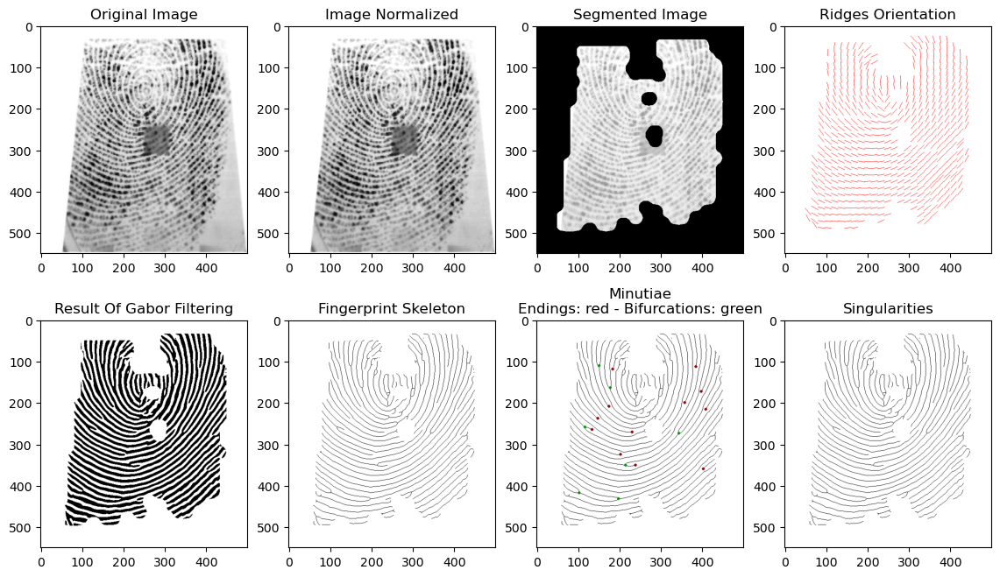

In [47]:
# Wiener filter needs the input image as float (not uint8)
# the (5,5) corresponds to the sized of the window to considered during the processing.
img_wiener = wiener(left_thumb1_bad.astype('float64'), (5,5))
# is necessary to convert the output back to uint8. 
# some additional steps are necessary to have it in 0-255. 
img_wiener = img_as_ubyte((img_wiener-np.min(img_wiener))/(np.max(img_wiener)-np.min(img_wiener)))

plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.imshow(left_thumb1_bad); plt.title('Original image')
plt.subplot(1,2,2)
plt.imshow(img_wiener); plt.title('Wiener filter')

fingerprint_processing(img_wiener)

#### Left Thumb #1 (Bad) Without Weiner:

Total of minutiae detected: 50
Total of singularities detected: 4


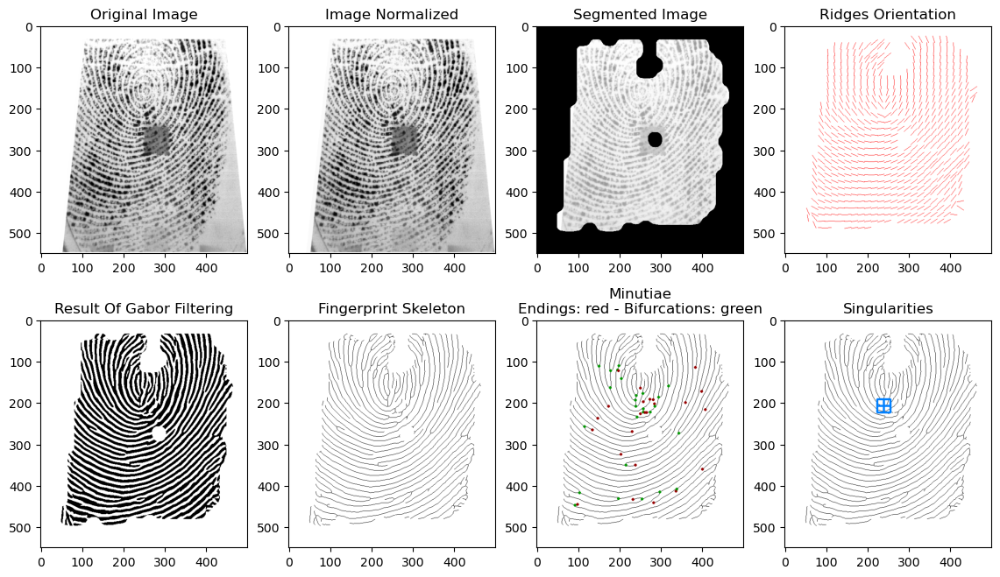

In [48]:
fingerprint_processing(left_thumb1_bad)

#### Left Thumb #2 (Good) With Weiner:

Total of minutiae detected: 69
Total of singularities detected: 4


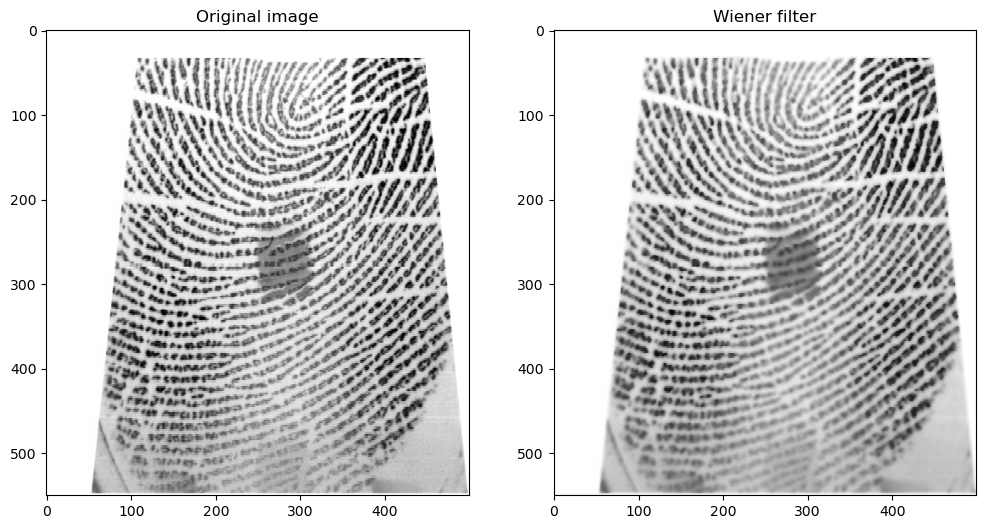

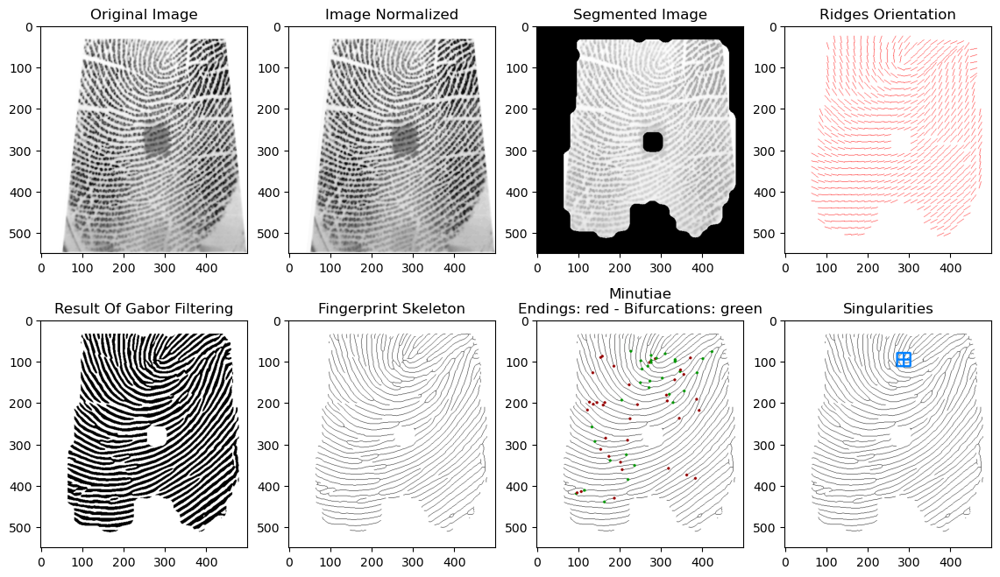

In [49]:
# Wiener filter needs the input image as float (not uint8)
# the (5,5) corresponds to the sized of the window to considered during the processing.
img_wiener = wiener(left_thumb2_good.astype('float64'), (5,5))
# is necessary to convert the output back to uint8. 
# some additional steps are necessary to have it in 0-255. 
img_wiener = img_as_ubyte((img_wiener-np.min(img_wiener))/(np.max(img_wiener)-np.min(img_wiener)))

plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.imshow(left_thumb2_good); plt.title('Original image')
plt.subplot(1,2,2)
plt.imshow(img_wiener); plt.title('Wiener filter')

fingerprint_processing(img_wiener)

#### Left Thumb #2 (Good) Without Weiner:

Total of minutiae detected: 120
Total of singularities detected: 4


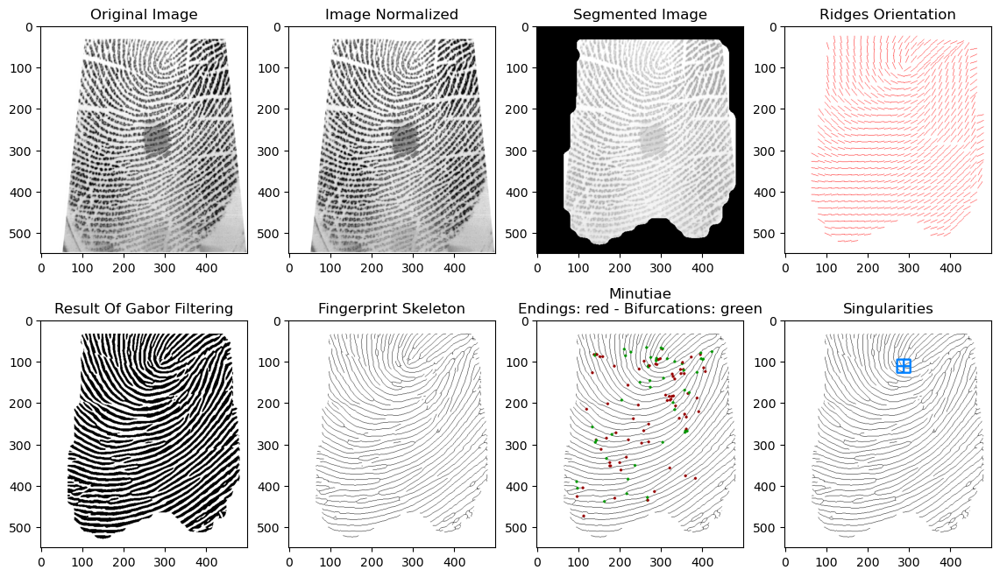

In [50]:
fingerprint_processing(left_thumb2_good)

#### Left Thumb #2 (Bad) With Weiner:

Total of minutiae detected: 49
Total of singularities detected: 0


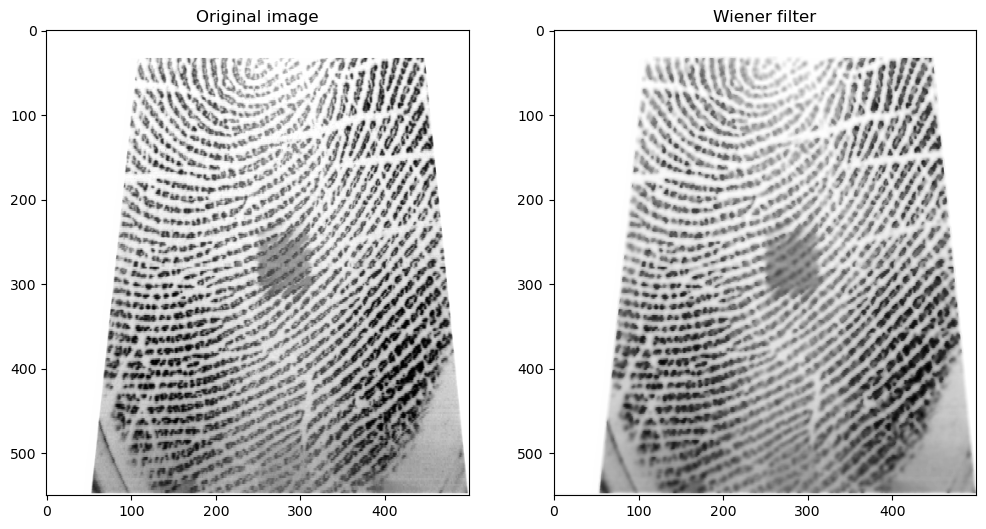

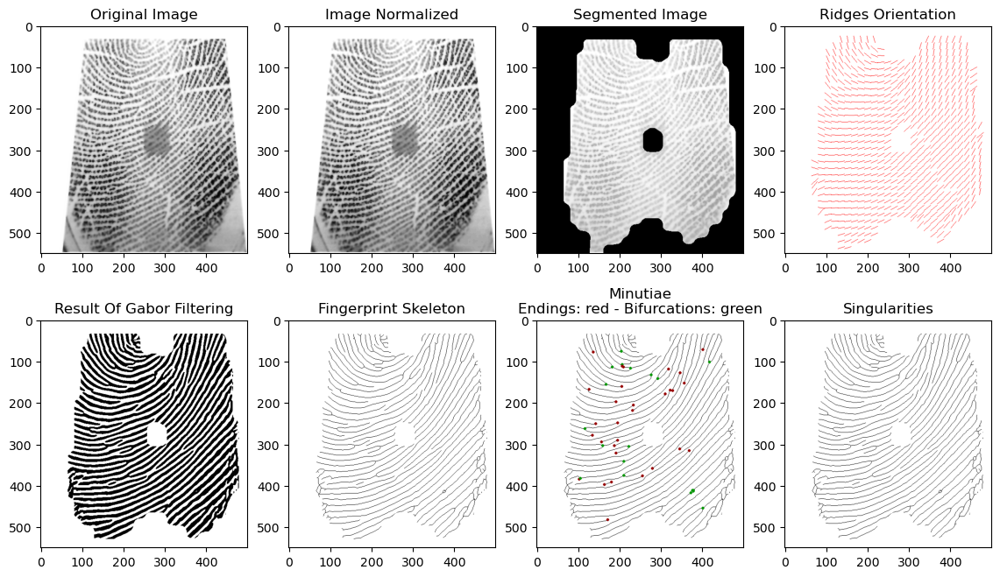

In [51]:
# Wiener filter needs the input image as float (not uint8)
# the (5,5) corresponds to the sized of the window to considered during the processing.
img_wiener = wiener(left_thumb2_bad.astype('float64'), (5,5))
# is necessary to convert the output back to uint8. 
# some additional steps are necessary to have it in 0-255. 
img_wiener = img_as_ubyte((img_wiener-np.min(img_wiener))/(np.max(img_wiener)-np.min(img_wiener)))

plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
plt.imshow(left_thumb2_bad); plt.title('Original image')
plt.subplot(1,2,2)
plt.imshow(img_wiener); plt.title('Wiener filter')

fingerprint_processing(img_wiener)

#### Left Thumb #2 (Bad) Without Weiner:

Total of minutiae detected: 75
Total of singularities detected: 0


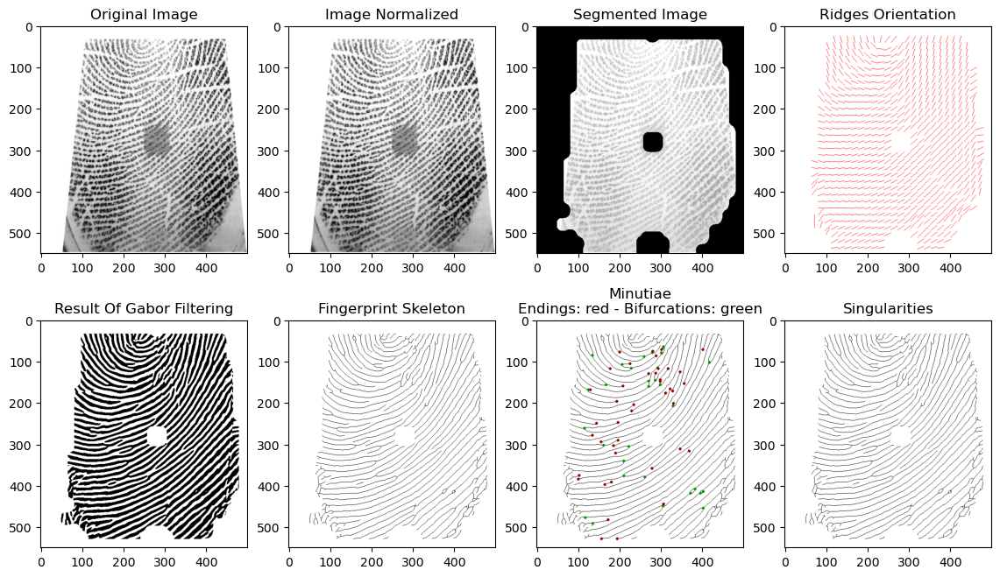

In [52]:
fingerprint_processing(left_thumb2_bad)

#### Analysis Of Data:

## **Exercise 3:**

#### Analysis Of Data:

# **Conclusion:**